https://medium.com/@manoharmanok/implementing-dcgan-in-pytorch-using-the-celeba-dataset-a-comprehensive-guide-660e6e8e29d2

In [1]:
!pip install torch torchvision tqdm matplotlib numpy


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 906.4/906.4 MB 56.8 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 130.1 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 167.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 167.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 225.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 70.4 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 125.9 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 85.3 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 149.6 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 136.5 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.7/188.7 MB 146.9 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
from tqdm import tqdm
import torchvision.datasets as datasets
from torchvision.datasets import ImageFolder
from torchvision.utils import make_grid
import torchvision.utils as vutils
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from torch.utils.data import Subset
import numpy as np

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [4]:
LEARNING_RATE = 3e-3  # could also use two lrs, one for gen and one for disc
BATCH_SIZE = 64
IMAGE_SIZE = 64
CHANNELS_IMG = 3
Z_DIM = 128
NUM_EPOCHS = 400
FEATURES_DISC = 64
FEATURES_GEN = 64

In [5]:
# Define the transformations
transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

# Path to the folder containing Pablo Picasso's images
path = '_data/art/Rembrandt'

# Create a dataset for only the Pablo Picasso folder
dataset = datasets.ImageFolder(path, transform=transform)

# Create a DataLoader
dataloader = DataLoader(dataset=dataset, batch_size=BATCH_SIZE, shuffle=True)


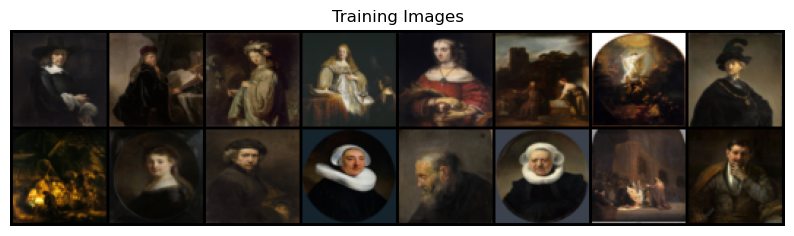

In [34]:
real_batch = next(iter(dataloader))
plt.figure(figsize=(10,10))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:16], padding=2, normalize=True).cpu(),(1,2,0)))

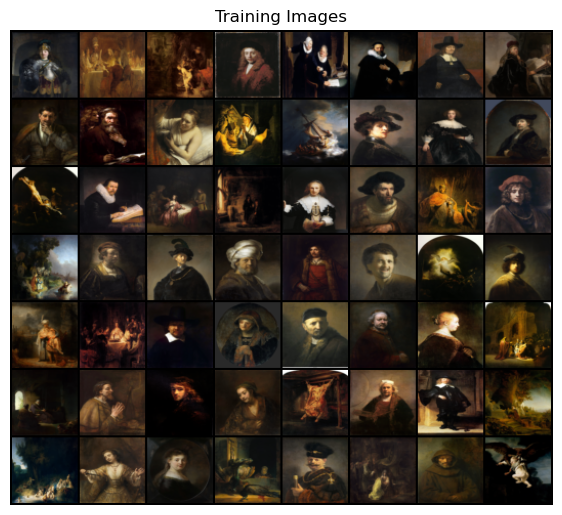

In [6]:
real_batch = next(iter(dataloader))
plt.figure(figsize=(7,7))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:56], padding=2, normalize=True).cpu(),(1,2,0)))

### Generator

In [7]:
class Generator(nn.Module):
    def __init__(self, z_dim, channels_img, features_g):
        super(Generator, self).__init__()
        self.net = nn.Sequential(
            self._block(z_dim, features_g * 16, 4, 1, 0),  # 4x4
            nn.Upsample(scale_factor=2),  # Replace ConvTranspose with Upsample
            nn.Conv2d(features_g * 16, features_g * 8, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(features_g * 8),
            nn.ReLU(True),
            nn.Upsample(scale_factor=2),
            nn.Conv2d(features_g * 8, features_g * 4, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(features_g * 4),
            nn.ReLU(True),
            nn.Upsample(scale_factor=2),
            nn.Conv2d(features_g * 4, features_g * 2, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(features_g * 2),
            nn.ReLU(True),
            nn.Upsample(scale_factor=2),
            nn.Conv2d(features_g * 2, channels_img, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def _block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.ConvTranspose2d(
                in_channels,
                out_channels,
                kernel_size,
                stride,
                padding,
                bias=False
            ),
            nn.BatchNorm2d(out_channels),
            nn.ReLU()
        )

    def forward(self, x):
        return self.net(x)


### Descriminator

In [8]:
class Discriminator(nn.Module):
    def __init__(self, channels_img, features_d):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            nn.Conv2d(channels_img, features_d, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),  # Dropout to prevent overfitting
            self._block(features_d, features_d * 2, 4, 2, 1),
            nn.Dropout(0.3),  # Dropout to prevent overfitting
            self._block(features_d * 2, features_d * 4, 4, 2, 1),
            nn.Dropout(0.3),  # Dropout to prevent overfitting
            self._block(features_d * 4, features_d * 8, 4, 2, 1),
            nn.Conv2d(features_d * 8, 1, kernel_size=4, stride=2, padding=0),
            nn.Sigmoid()
        )

    def _block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.Conv2d(
                in_channels,
                out_channels,
                kernel_size,
                stride,
                padding,
                bias=False
            ),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.2)
        )

    def forward(self, x):
        return self.disc(x)


## Setting the Model

In [9]:
def initialize_weights(model):
    classname = model.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(model.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(model.weight.data, 1.0, 0.02)
        nn.init.constant_(model.bias.data, 0)

gen = Generator(Z_DIM, CHANNELS_IMG, FEATURES_GEN).to(device)
disc = Discriminator(CHANNELS_IMG, FEATURES_DISC).to(device)

initialize_weights(gen)
initialize_weights(disc)

opt_gen = optim.Adam(gen.parameters(), lr=LEARNING_RATE, betas=(0.5, 0.999))
opt_disc = optim.Adam(disc.parameters(), lr=LEARNING_RATE, betas=(0.5, 0.999))
criterion = nn.BCELoss()

fixed_noise = torch.randn(32, Z_DIM, 1, 1).to(device)

In [10]:
def show_tensor_images(image_tensor, num_images=32, size=(1, 64, 64)):
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=4)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

## Start Training

Epoch [0/400] Batch 0/5                   Loss D: 0.7141, loss G: 0.0169 
 Disc Real Prob 0.604941725730896 Disc Fake Prob 0.6033868193626404


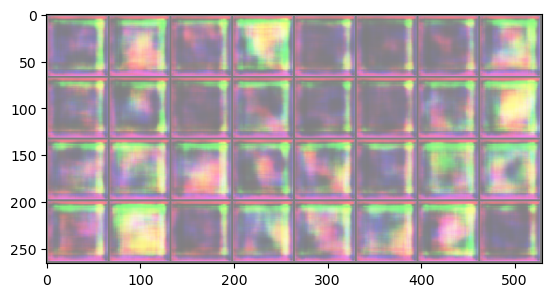

Epoch [1/400] Batch 0/5                   Loss D: 1.4173, loss G: 2.1736 
 Disc Real Prob 0.6268458962440491 Disc Fake Prob 0.6114830374717712
Epoch [2/400] Batch 0/5                   Loss D: 0.6967, loss G: 1.6450 
 Disc Real Prob 0.6697055101394653 Disc Fake Prob 0.6182197332382202
Epoch [3/400] Batch 0/5                   Loss D: 0.8643, loss G: 2.2445 
 Disc Real Prob 0.6065914034843445 Disc Fake Prob 0.5705228447914124
Epoch [4/400] Batch 0/5                   Loss D: 0.6267, loss G: 2.2579 
 Disc Real Prob 0.6546927690505981 Disc Fake Prob 0.5692827701568604
Epoch [5/400] Batch 0/5                   Loss D: 1.8439, loss G: 0.9352 
 Disc Real Prob 0.5772546529769897 Disc Fake Prob 0.5934085249900818
Epoch [6/400] Batch 0/5                   Loss D: 1.3805, loss G: 3.2903 
 Disc Real Prob 0.6807861924171448 Disc Fake Prob 0.6561604738235474
Epoch [7/400] Batch 0/5                   Loss D: 0.9331, loss G: 3.0251 
 Disc Real Prob 0.6645417809486389 Disc Fake Prob 0.6577844619750977

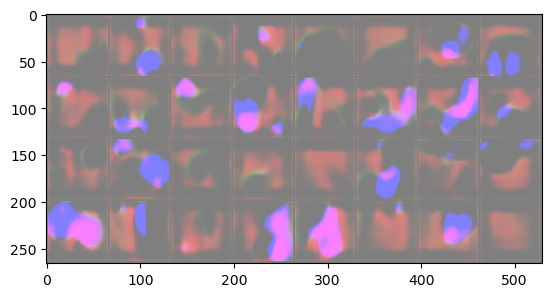

Epoch [11/400] Batch 0/5                   Loss D: 0.3489, loss G: 3.2475 
 Disc Real Prob 0.7142158150672913 Disc Fake Prob 0.5689569711685181
Epoch [12/400] Batch 0/5                   Loss D: 0.4456, loss G: 1.5210 
 Disc Real Prob 0.66875159740448 Disc Fake Prob 0.5710394382476807
Epoch [13/400] Batch 0/5                   Loss D: 0.4347, loss G: 3.8603 
 Disc Real Prob 0.6708711981773376 Disc Fake Prob 0.5567939877510071
Epoch [14/400] Batch 0/5                   Loss D: 0.4574, loss G: 2.3241 
 Disc Real Prob 0.7052009105682373 Disc Fake Prob 0.6104065179824829
Epoch [15/400] Batch 0/5                   Loss D: 2.0504, loss G: 3.1550 
 Disc Real Prob 0.7258926630020142 Disc Fake Prob 0.6905529499053955
Epoch [16/400] Batch 0/5                   Loss D: 2.4086, loss G: 2.1409 
 Disc Real Prob 0.6729586124420166 Disc Fake Prob 0.6033412218093872
Epoch [17/400] Batch 0/5                   Loss D: 0.8805, loss G: 1.5504 
 Disc Real Prob 0.6046932339668274 Disc Fake Prob 0.54398280382

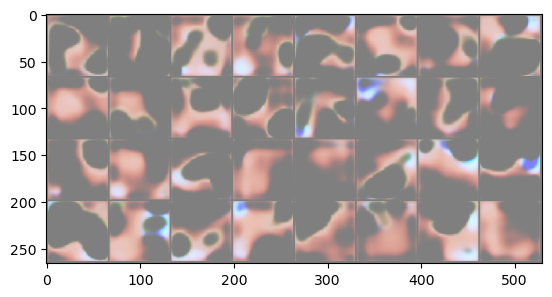

Epoch [21/400] Batch 0/5                   Loss D: 0.5677, loss G: 2.2049 
 Disc Real Prob 0.6715430021286011 Disc Fake Prob 0.6089974045753479
Epoch [22/400] Batch 0/5                   Loss D: 0.4137, loss G: 1.4354 
 Disc Real Prob 0.6638233661651611 Disc Fake Prob 0.5640769600868225
Epoch [23/400] Batch 0/5                   Loss D: 1.2311, loss G: 2.0748 
 Disc Real Prob 0.7064056396484375 Disc Fake Prob 0.5711526870727539
Epoch [24/400] Batch 0/5                   Loss D: 0.2438, loss G: 2.4048 
 Disc Real Prob 0.7001294493675232 Disc Fake Prob 0.5550730228424072
Epoch [25/400] Batch 0/5                   Loss D: 0.7036, loss G: 1.4790 
 Disc Real Prob 0.6508076190948486 Disc Fake Prob 0.5852298736572266
Epoch [26/400] Batch 0/5                   Loss D: 0.6034, loss G: 2.1302 
 Disc Real Prob 0.6424473524093628 Disc Fake Prob 0.5540611147880554
Epoch [27/400] Batch 0/5                   Loss D: 0.6182, loss G: 3.0949 
 Disc Real Prob 0.6873239278793335 Disc Fake Prob 0.621313452

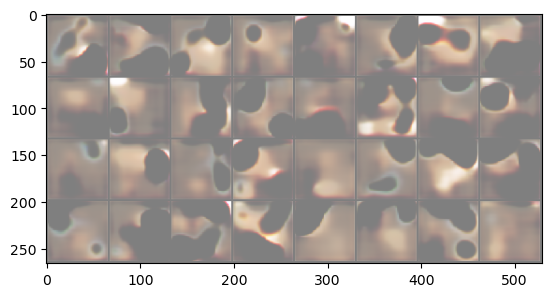

Epoch [31/400] Batch 0/5                   Loss D: 0.9089, loss G: 1.4699 
 Disc Real Prob 0.6190694570541382 Disc Fake Prob 0.581326961517334
Epoch [32/400] Batch 0/5                   Loss D: 0.5740, loss G: 2.5035 
 Disc Real Prob 0.6484850645065308 Disc Fake Prob 0.5950934886932373
Epoch [33/400] Batch 0/5                   Loss D: 0.6797, loss G: 1.7524 
 Disc Real Prob 0.6193488240242004 Disc Fake Prob 0.5699615478515625
Epoch [34/400] Batch 0/5                   Loss D: 0.8303, loss G: 1.2757 
 Disc Real Prob 0.6516779661178589 Disc Fake Prob 0.6383113861083984
Epoch [35/400] Batch 0/5                   Loss D: 0.9632, loss G: 1.2956 
 Disc Real Prob 0.6606886386871338 Disc Fake Prob 0.6386215090751648
Epoch [36/400] Batch 0/5                   Loss D: 0.7696, loss G: 1.2923 
 Disc Real Prob 0.6271485090255737 Disc Fake Prob 0.5910985469818115
Epoch [37/400] Batch 0/5                   Loss D: 1.0238, loss G: 0.9845 
 Disc Real Prob 0.5798699259757996 Disc Fake Prob 0.5409688949

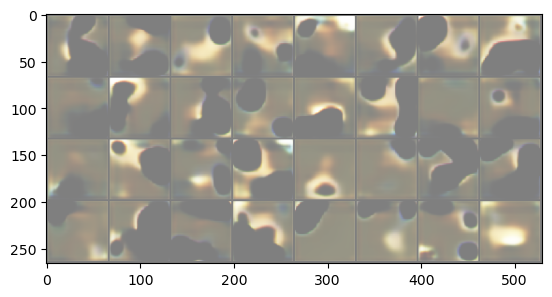

Epoch [41/400] Batch 0/5                   Loss D: 0.6815, loss G: 1.2806 
 Disc Real Prob 0.632479190826416 Disc Fake Prob 0.5976505279541016
Epoch [42/400] Batch 0/5                   Loss D: 0.6984, loss G: 1.2365 
 Disc Real Prob 0.6201513409614563 Disc Fake Prob 0.5700263381004333
Epoch [43/400] Batch 0/5                   Loss D: 0.6502, loss G: 2.8061 
 Disc Real Prob 0.6835128664970398 Disc Fake Prob 0.6364257335662842
Epoch [44/400] Batch 0/5                   Loss D: 0.6836, loss G: 1.1032 
 Disc Real Prob 0.6171721816062927 Disc Fake Prob 0.5714183449745178
Epoch [45/400] Batch 0/5                   Loss D: 0.5653, loss G: 2.1675 
 Disc Real Prob 0.6701067686080933 Disc Fake Prob 0.5999830365180969
Epoch [46/400] Batch 0/5                   Loss D: 0.5882, loss G: 2.9686 
 Disc Real Prob 0.6886599659919739 Disc Fake Prob 0.6228041052818298
Epoch [47/400] Batch 0/5                   Loss D: 0.5459, loss G: 1.1962 
 Disc Real Prob 0.6384608745574951 Disc Fake Prob 0.5671642422

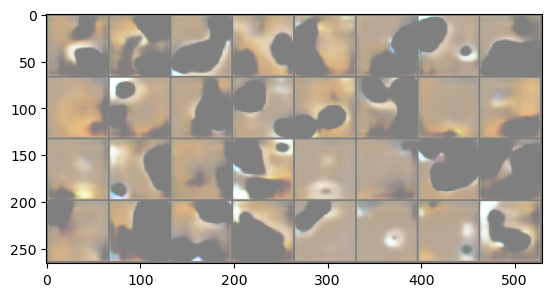

Epoch [51/400] Batch 0/5                   Loss D: 0.7365, loss G: 3.5474 
 Disc Real Prob 0.6810518503189087 Disc Fake Prob 0.6362541317939758
Epoch [52/400] Batch 0/5                   Loss D: 0.7759, loss G: 2.3570 
 Disc Real Prob 0.7018473744392395 Disc Fake Prob 0.6507083773612976
Epoch [53/400] Batch 0/5                   Loss D: 1.1940, loss G: 2.4169 
 Disc Real Prob 0.6859750747680664 Disc Fake Prob 0.6659001111984253
Epoch [54/400] Batch 0/5                   Loss D: 0.7278, loss G: 1.6297 
 Disc Real Prob 0.63094162940979 Disc Fake Prob 0.6021556854248047
Epoch [55/400] Batch 0/5                   Loss D: 0.7600, loss G: 2.2983 
 Disc Real Prob 0.6965242624282837 Disc Fake Prob 0.6448732614517212
Epoch [56/400] Batch 0/5                   Loss D: 0.5549, loss G: 2.0715 
 Disc Real Prob 0.6543822884559631 Disc Fake Prob 0.5891536474227905
Epoch [57/400] Batch 0/5                   Loss D: 0.6749, loss G: 1.4248 
 Disc Real Prob 0.6588762998580933 Disc Fake Prob 0.62292397022

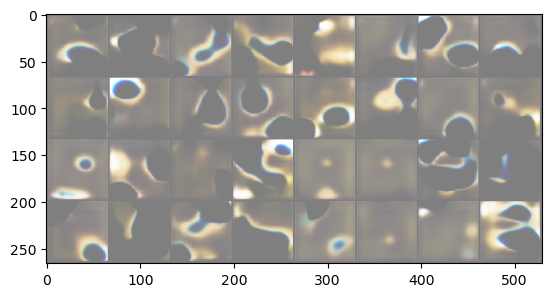

Epoch [61/400] Batch 0/5                   Loss D: 1.3635, loss G: 5.5125 
 Disc Real Prob 0.7149219512939453 Disc Fake Prob 0.6985621452331543
Epoch [62/400] Batch 0/5                   Loss D: 0.7554, loss G: 1.6112 
 Disc Real Prob 0.646386981010437 Disc Fake Prob 0.6153616309165955
Epoch [63/400] Batch 0/5                   Loss D: 1.0485, loss G: 1.7966 
 Disc Real Prob 0.6888774633407593 Disc Fake Prob 0.6680500507354736
Epoch [64/400] Batch 0/5                   Loss D: 0.6185, loss G: 1.5082 
 Disc Real Prob 0.6042424440383911 Disc Fake Prob 0.5487948060035706
Epoch [65/400] Batch 0/5                   Loss D: 0.4999, loss G: 2.4418 
 Disc Real Prob 0.6804162263870239 Disc Fake Prob 0.6069087386131287
Epoch [66/400] Batch 0/5                   Loss D: 0.5954, loss G: 3.4691 
 Disc Real Prob 0.693058967590332 Disc Fake Prob 0.6313639879226685
Epoch [67/400] Batch 0/5                   Loss D: 0.5760, loss G: 1.3002 
 Disc Real Prob 0.715315580368042 Disc Fake Prob 0.646060407161

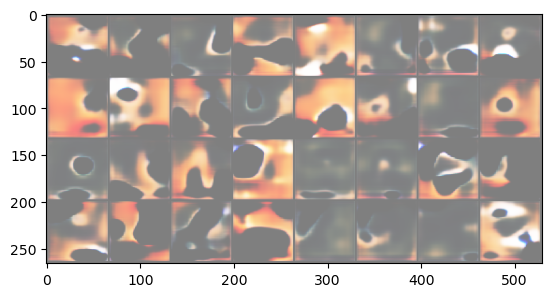

Epoch [71/400] Batch 0/5                   Loss D: 0.4945, loss G: 2.4257 
 Disc Real Prob 0.6911187767982483 Disc Fake Prob 0.5989720821380615
Epoch [72/400] Batch 0/5                   Loss D: 1.2226, loss G: 3.1703 
 Disc Real Prob 0.6836673021316528 Disc Fake Prob 0.6823369264602661
Epoch [73/400] Batch 0/5                   Loss D: 0.7025, loss G: 2.1860 
 Disc Real Prob 0.6974157691001892 Disc Fake Prob 0.6380903720855713
Epoch [74/400] Batch 0/5                   Loss D: 0.4415, loss G: 1.6258 
 Disc Real Prob 0.6834619045257568 Disc Fake Prob 0.5905382633209229
Epoch [75/400] Batch 0/5                   Loss D: 0.5523, loss G: 2.1699 
 Disc Real Prob 0.6629252433776855 Disc Fake Prob 0.5790891647338867
Epoch [76/400] Batch 0/5                   Loss D: 0.4566, loss G: 3.0804 
 Disc Real Prob 0.7099523544311523 Disc Fake Prob 0.5969628095626831
Epoch [77/400] Batch 0/5                   Loss D: 0.7717, loss G: 1.1108 
 Disc Real Prob 0.6212007999420166 Disc Fake Prob 0.542213261

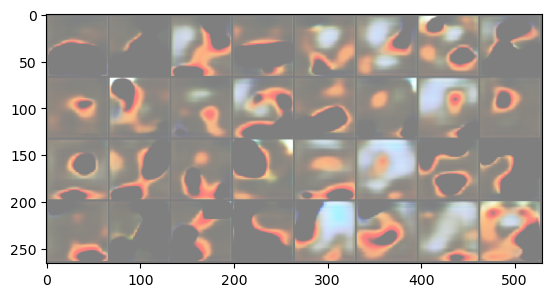

Epoch [81/400] Batch 0/5                   Loss D: 0.5567, loss G: 1.8825 
 Disc Real Prob 0.6403879523277283 Disc Fake Prob 0.5513432025909424
Epoch [82/400] Batch 0/5                   Loss D: 0.6862, loss G: 2.4347 
 Disc Real Prob 0.673740804195404 Disc Fake Prob 0.6275299787521362
Epoch [83/400] Batch 0/5                   Loss D: 0.6530, loss G: 3.3736 
 Disc Real Prob 0.705472469329834 Disc Fake Prob 0.642593264579773
Epoch [84/400] Batch 0/5                   Loss D: 0.9286, loss G: 2.1841 
 Disc Real Prob 0.7131181955337524 Disc Fake Prob 0.6631684899330139
Epoch [85/400] Batch 0/5                   Loss D: 0.6410, loss G: 2.3257 
 Disc Real Prob 0.692439615726471 Disc Fake Prob 0.6337888836860657
Epoch [86/400] Batch 0/5                   Loss D: 0.5157, loss G: 1.6911 
 Disc Real Prob 0.6647659540176392 Disc Fake Prob 0.5953168272972107
Epoch [87/400] Batch 0/5                   Loss D: 0.5727, loss G: 2.0613 
 Disc Real Prob 0.6574631929397583 Disc Fake Prob 0.6031705737113

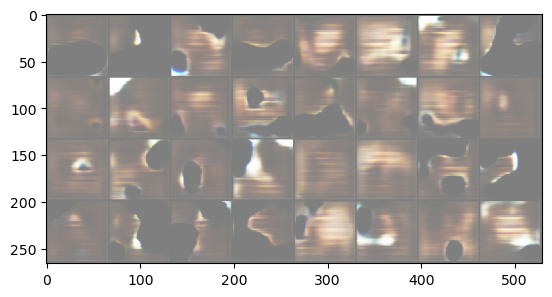

Epoch [91/400] Batch 0/5                   Loss D: 0.7829, loss G: 1.7581 
 Disc Real Prob 0.6382739543914795 Disc Fake Prob 0.6231489181518555
Epoch [92/400] Batch 0/5                   Loss D: 0.5707, loss G: 2.2143 
 Disc Real Prob 0.6456407308578491 Disc Fake Prob 0.5909660458564758
Epoch [93/400] Batch 0/5                   Loss D: 0.4515, loss G: 2.2553 
 Disc Real Prob 0.6899535655975342 Disc Fake Prob 0.6051387786865234
Epoch [94/400] Batch 0/5                   Loss D: 0.6366, loss G: 3.7118 
 Disc Real Prob 0.6863056421279907 Disc Fake Prob 0.6274511218070984
Epoch [95/400] Batch 0/5                   Loss D: 0.6431, loss G: 2.4285 
 Disc Real Prob 0.6999169588088989 Disc Fake Prob 0.6415315866470337
Epoch [96/400] Batch 0/5                   Loss D: 0.5513, loss G: 2.6206 
 Disc Real Prob 0.6657781600952148 Disc Fake Prob 0.5868446230888367
Epoch [97/400] Batch 0/5                   Loss D: 0.4666, loss G: 2.2000 
 Disc Real Prob 0.667992115020752 Disc Fake Prob 0.5695755481

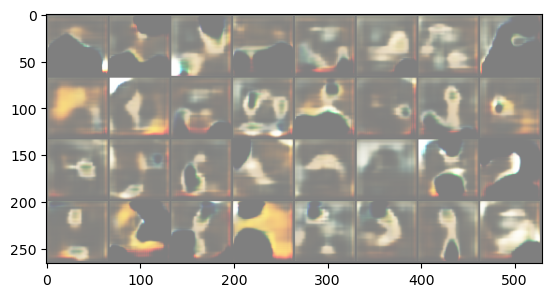

Epoch [101/400] Batch 0/5                   Loss D: 0.6755, loss G: 2.3825 
 Disc Real Prob 0.6889932155609131 Disc Fake Prob 0.6414405107498169
Epoch [102/400] Batch 0/5                   Loss D: 0.5354, loss G: 2.3772 
 Disc Real Prob 0.6177996397018433 Disc Fake Prob 0.537562370300293
Epoch [103/400] Batch 0/5                   Loss D: 0.5786, loss G: 2.2574 
 Disc Real Prob 0.7056763172149658 Disc Fake Prob 0.6311468482017517
Epoch [104/400] Batch 0/5                   Loss D: 0.5900, loss G: 2.1658 
 Disc Real Prob 0.6088478565216064 Disc Fake Prob 0.5343797206878662
Epoch [105/400] Batch 0/5                   Loss D: 0.5402, loss G: 2.3488 
 Disc Real Prob 0.6371098756790161 Disc Fake Prob 0.5575266480445862
Epoch [106/400] Batch 0/5                   Loss D: 0.6987, loss G: 3.1652 
 Disc Real Prob 0.7099192142486572 Disc Fake Prob 0.6536866426467896
Epoch [107/400] Batch 0/5                   Loss D: 0.4678, loss G: 1.8949 
 Disc Real Prob 0.6683028936386108 Disc Fake Prob 0.582

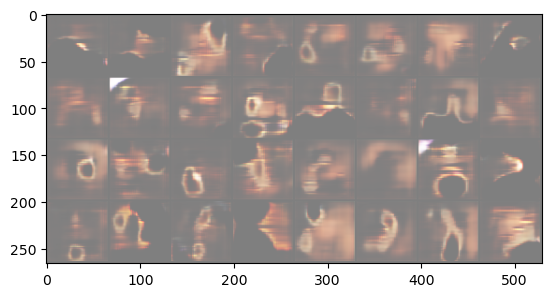

Epoch [111/400] Batch 0/5                   Loss D: 0.6754, loss G: 2.6252 
 Disc Real Prob 0.6948578357696533 Disc Fake Prob 0.6342388391494751
Epoch [112/400] Batch 0/5                   Loss D: 0.5753, loss G: 2.0457 
 Disc Real Prob 0.6037850379943848 Disc Fake Prob 0.5266662836074829
Epoch [113/400] Batch 0/5                   Loss D: 0.4742, loss G: 3.0912 
 Disc Real Prob 0.6707463264465332 Disc Fake Prob 0.5863609313964844
Epoch [114/400] Batch 0/5                   Loss D: 0.6408, loss G: 1.4104 
 Disc Real Prob 0.6354095935821533 Disc Fake Prob 0.5995794534683228
Epoch [115/400] Batch 0/5                   Loss D: 1.2255, loss G: 4.0586 
 Disc Real Prob 0.7084590792655945 Disc Fake Prob 0.6826414465904236
Epoch [116/400] Batch 0/5                   Loss D: 0.5602, loss G: 2.3963 
 Disc Real Prob 0.6761593818664551 Disc Fake Prob 0.6129984259605408
Epoch [117/400] Batch 0/5                   Loss D: 0.5133, loss G: 1.5825 
 Disc Real Prob 0.6328895092010498 Disc Fake Prob 0.56

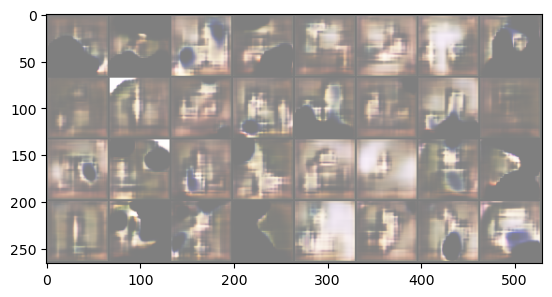

Epoch [121/400] Batch 0/5                   Loss D: 0.4005, loss G: 2.9824 
 Disc Real Prob 0.6802495718002319 Disc Fake Prob 0.5833228826522827
Epoch [122/400] Batch 0/5                   Loss D: 0.3869, loss G: 2.3864 
 Disc Real Prob 0.6956250071525574 Disc Fake Prob 0.5914875268936157
Epoch [123/400] Batch 0/5                   Loss D: 0.3135, loss G: 2.9459 
 Disc Real Prob 0.7080416083335876 Disc Fake Prob 0.5855652093887329
Epoch [124/400] Batch 0/5                   Loss D: 0.8042, loss G: 4.0630 
 Disc Real Prob 0.7128458023071289 Disc Fake Prob 0.6623641848564148
Epoch [125/400] Batch 0/5                   Loss D: 0.7408, loss G: 2.4976 
 Disc Real Prob 0.6811293959617615 Disc Fake Prob 0.6327357292175293
Epoch [126/400] Batch 0/5                   Loss D: 0.5632, loss G: 3.3847 
 Disc Real Prob 0.6869146823883057 Disc Fake Prob 0.61516273021698
Epoch [127/400] Batch 0/5                   Loss D: 0.4483, loss G: 2.0317 
 Disc Real Prob 0.6597228646278381 Disc Fake Prob 0.5706

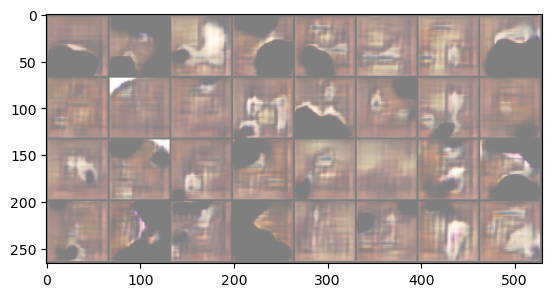

Epoch [131/400] Batch 0/5                   Loss D: 0.3684, loss G: 1.8574 
 Disc Real Prob 0.664297342300415 Disc Fake Prob 0.5632588863372803
Epoch [132/400] Batch 0/5                   Loss D: 0.7036, loss G: 3.3638 
 Disc Real Prob 0.7002333998680115 Disc Fake Prob 0.6367619037628174
Epoch [133/400] Batch 0/5                   Loss D: 0.5309, loss G: 3.0217 
 Disc Real Prob 0.7009216547012329 Disc Fake Prob 0.6171684265136719
Epoch [134/400] Batch 0/5                   Loss D: 0.6454, loss G: 2.7582 
 Disc Real Prob 0.6818720102310181 Disc Fake Prob 0.61296546459198
Epoch [135/400] Batch 0/5                   Loss D: 0.2928, loss G: 2.7592 
 Disc Real Prob 0.6797198057174683 Disc Fake Prob 0.5522770881652832
Epoch [136/400] Batch 0/5                   Loss D: 0.7017, loss G: 3.9892 
 Disc Real Prob 0.7157388925552368 Disc Fake Prob 0.6510535478591919
Epoch [137/400] Batch 0/5                   Loss D: 0.8537, loss G: 3.9932 
 Disc Real Prob 0.7026189565658569 Disc Fake Prob 0.66513

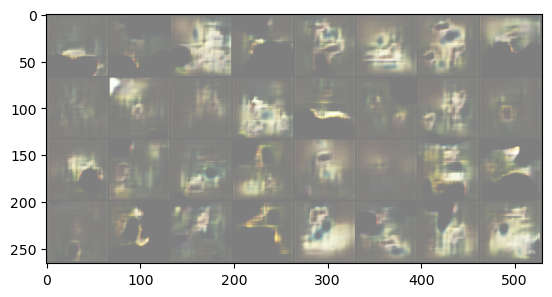

Epoch [141/400] Batch 0/5                   Loss D: 0.7784, loss G: 3.8604 
 Disc Real Prob 0.7163056135177612 Disc Fake Prob 0.657767117023468
Epoch [142/400] Batch 0/5                   Loss D: 0.4694, loss G: 1.8084 
 Disc Real Prob 0.6733348965644836 Disc Fake Prob 0.5928065180778503
Epoch [143/400] Batch 0/5                   Loss D: 0.5689, loss G: 3.1552 
 Disc Real Prob 0.6667622327804565 Disc Fake Prob 0.5963193774223328
Epoch [144/400] Batch 0/5                   Loss D: 0.5267, loss G: 1.8638 
 Disc Real Prob 0.6310489177703857 Disc Fake Prob 0.5519741773605347
Epoch [145/400] Batch 0/5                   Loss D: 0.3641, loss G: 2.2608 
 Disc Real Prob 0.6861754655838013 Disc Fake Prob 0.5768294334411621
Epoch [146/400] Batch 0/5                   Loss D: 0.4399, loss G: 2.4899 
 Disc Real Prob 0.6968479752540588 Disc Fake Prob 0.6039795279502869
Epoch [147/400] Batch 0/5                   Loss D: 0.9186, loss G: 4.0748 
 Disc Real Prob 0.6820074319839478 Disc Fake Prob 0.654

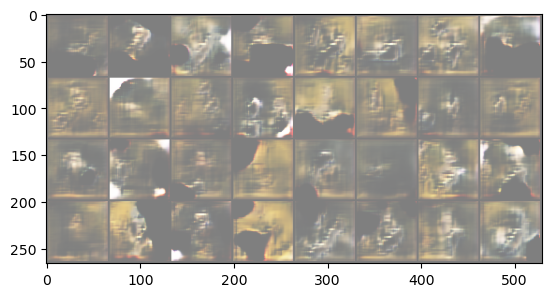

Epoch [151/400] Batch 0/5                   Loss D: 0.6598, loss G: 3.5722 
 Disc Real Prob 0.6632387638092041 Disc Fake Prob 0.6145881414413452
Epoch [152/400] Batch 0/5                   Loss D: 0.9258, loss G: 4.8405 
 Disc Real Prob 0.6952311992645264 Disc Fake Prob 0.6570379734039307
Epoch [153/400] Batch 0/5                   Loss D: 0.8398, loss G: 3.2600 
 Disc Real Prob 0.7040768265724182 Disc Fake Prob 0.6477603912353516
Epoch [154/400] Batch 0/5                   Loss D: 0.3665, loss G: 2.2292 
 Disc Real Prob 0.6824970245361328 Disc Fake Prob 0.5733189582824707
Epoch [155/400] Batch 0/5                   Loss D: 0.3809, loss G: 1.7822 
 Disc Real Prob 0.6614556312561035 Disc Fake Prob 0.5594102144241333
Epoch [156/400] Batch 0/5                   Loss D: 0.4810, loss G: 2.1435 
 Disc Real Prob 0.6524391770362854 Disc Fake Prob 0.5752406120300293
Epoch [157/400] Batch 0/5                   Loss D: 0.4284, loss G: 3.3336 
 Disc Real Prob 0.6787121295928955 Disc Fake Prob 0.58

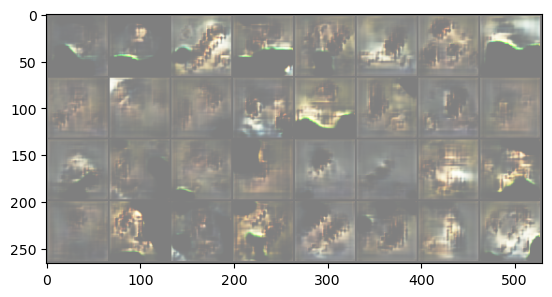

Epoch [161/400] Batch 0/5                   Loss D: 0.5008, loss G: 2.8532 
 Disc Real Prob 0.6905768513679504 Disc Fake Prob 0.5978533625602722
Epoch [162/400] Batch 0/5                   Loss D: 0.5428, loss G: 2.1351 
 Disc Real Prob 0.676459014415741 Disc Fake Prob 0.6012958884239197
Epoch [163/400] Batch 0/5                   Loss D: 0.5126, loss G: 2.1013 
 Disc Real Prob 0.6325671672821045 Disc Fake Prob 0.5541579723358154
Epoch [164/400] Batch 0/5                   Loss D: 0.5477, loss G: 2.8630 
 Disc Real Prob 0.7015956044197083 Disc Fake Prob 0.612669825553894
Epoch [165/400] Batch 0/5                   Loss D: 0.8353, loss G: 3.4112 
 Disc Real Prob 0.7176957130432129 Disc Fake Prob 0.6577391028404236
Epoch [166/400] Batch 0/5                   Loss D: 0.7513, loss G: 2.6821 
 Disc Real Prob 0.6912955045700073 Disc Fake Prob 0.6360142827033997
Epoch [167/400] Batch 0/5                   Loss D: 0.2703, loss G: 3.1000 
 Disc Real Prob 0.6779493689537048 Disc Fake Prob 0.5422

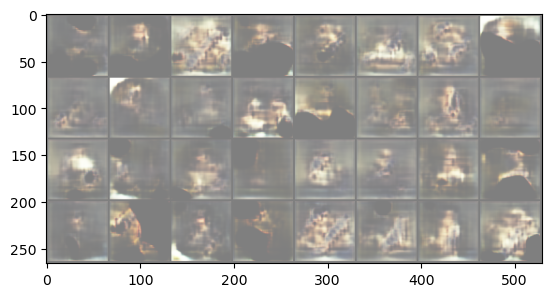

Epoch [171/400] Batch 0/5                   Loss D: 0.4458, loss G: 4.0452 
 Disc Real Prob 0.703025221824646 Disc Fake Prob 0.5945488214492798
Epoch [172/400] Batch 0/5                   Loss D: 0.3898, loss G: 2.1951 
 Disc Real Prob 0.6788636445999146 Disc Fake Prob 0.575861930847168
Epoch [173/400] Batch 0/5                   Loss D: 0.6590, loss G: 4.0110 
 Disc Real Prob 0.7169279456138611 Disc Fake Prob 0.643173098564148
Epoch [174/400] Batch 0/5                   Loss D: 0.4651, loss G: 2.0863 
 Disc Real Prob 0.6417778730392456 Disc Fake Prob 0.562113881111145
Epoch [175/400] Batch 0/5                   Loss D: 0.5239, loss G: 2.0558 
 Disc Real Prob 0.6392021179199219 Disc Fake Prob 0.572136402130127
Epoch [176/400] Batch 0/5                   Loss D: 0.5482, loss G: 1.8530 
 Disc Real Prob 0.6455647945404053 Disc Fake Prob 0.5762020945549011
Epoch [177/400] Batch 0/5                   Loss D: 0.5238, loss G: 3.4602 
 Disc Real Prob 0.6879866123199463 Disc Fake Prob 0.5936343

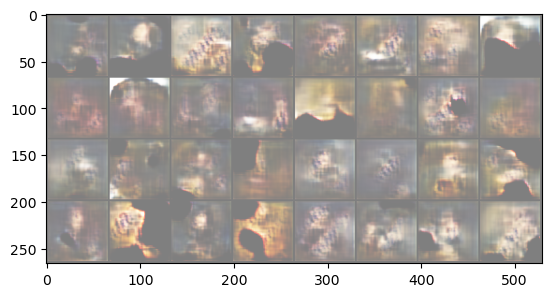

Epoch [181/400] Batch 0/5                   Loss D: 0.4647, loss G: 2.6610 
 Disc Real Prob 0.6825540661811829 Disc Fake Prob 0.5891548991203308
Epoch [182/400] Batch 0/5                   Loss D: 0.7132, loss G: 4.2526 
 Disc Real Prob 0.7162349224090576 Disc Fake Prob 0.641405463218689
Epoch [183/400] Batch 0/5                   Loss D: 0.4563, loss G: 2.5470 
 Disc Real Prob 0.6712573766708374 Disc Fake Prob 0.5694774985313416
Epoch [184/400] Batch 0/5                   Loss D: 0.4862, loss G: 2.1327 
 Disc Real Prob 0.6401647925376892 Disc Fake Prob 0.5529601573944092
Epoch [185/400] Batch 0/5                   Loss D: 0.6249, loss G: 3.1673 
 Disc Real Prob 0.6735910177230835 Disc Fake Prob 0.6041135787963867
Epoch [186/400] Batch 0/5                   Loss D: 0.3272, loss G: 2.2837 
 Disc Real Prob 0.6816017627716064 Disc Fake Prob 0.5584530234336853
Epoch [187/400] Batch 0/5                   Loss D: 0.3728, loss G: 2.8284 
 Disc Real Prob 0.6938060522079468 Disc Fake Prob 0.572

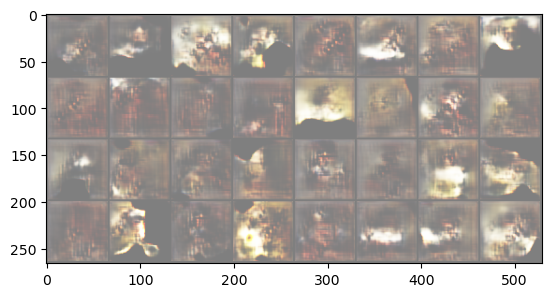

Epoch [191/400] Batch 0/5                   Loss D: 0.3316, loss G: 2.8471 
 Disc Real Prob 0.7111719846725464 Disc Fake Prob 0.5931270122528076
Epoch [192/400] Batch 0/5                   Loss D: 0.4030, loss G: 2.1417 
 Disc Real Prob 0.6689064502716064 Disc Fake Prob 0.5533053278923035
Epoch [193/400] Batch 0/5                   Loss D: 0.7335, loss G: 4.9560 
 Disc Real Prob 0.7146730422973633 Disc Fake Prob 0.644871711730957
Epoch [194/400] Batch 0/5                   Loss D: 0.6989, loss G: 3.4318 
 Disc Real Prob 0.6940569877624512 Disc Fake Prob 0.6291724443435669
Epoch [195/400] Batch 0/5                   Loss D: 0.7576, loss G: 2.7163 
 Disc Real Prob 0.6550606489181519 Disc Fake Prob 0.5911808013916016
Epoch [196/400] Batch 0/5                   Loss D: 0.8897, loss G: 2.7792 
 Disc Real Prob 0.7170146703720093 Disc Fake Prob 0.6676700115203857
Epoch [197/400] Batch 0/5                   Loss D: 0.4554, loss G: 2.4964 
 Disc Real Prob 0.6428863406181335 Disc Fake Prob 0.545

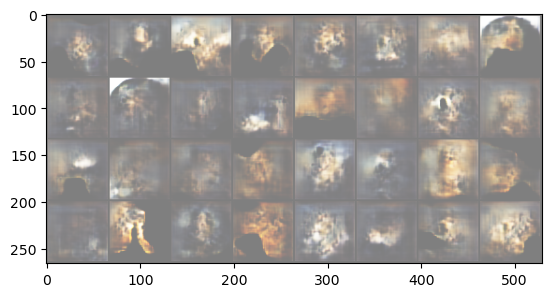

Epoch [201/400] Batch 0/5                   Loss D: 0.5319, loss G: 3.8126 
 Disc Real Prob 0.7090468406677246 Disc Fake Prob 0.6195725202560425
Epoch [202/400] Batch 0/5                   Loss D: 0.4278, loss G: 3.1171 
 Disc Real Prob 0.6910682916641235 Disc Fake Prob 0.5890408158302307
Epoch [203/400] Batch 0/5                   Loss D: 0.5771, loss G: 3.7315 
 Disc Real Prob 0.7231048345565796 Disc Fake Prob 0.6365938186645508
Epoch [204/400] Batch 0/5                   Loss D: 0.3974, loss G: 2.6204 
 Disc Real Prob 0.6788134574890137 Disc Fake Prob 0.5756001472473145
Epoch [205/400] Batch 0/5                   Loss D: 0.4813, loss G: 3.1041 
 Disc Real Prob 0.6688404679298401 Disc Fake Prob 0.5832467079162598
Epoch [206/400] Batch 0/5                   Loss D: 0.4368, loss G: 3.2321 
 Disc Real Prob 0.670047402381897 Disc Fake Prob 0.5778645873069763
Epoch [207/400] Batch 0/5                   Loss D: 0.5515, loss G: 3.2761 
 Disc Real Prob 0.7136557102203369 Disc Fake Prob 0.624

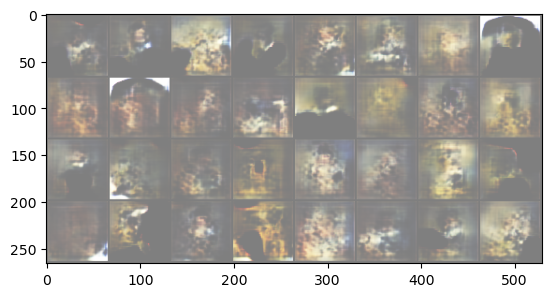

Epoch [211/400] Batch 0/5                   Loss D: 0.3878, loss G: 2.7259 
 Disc Real Prob 0.6670734286308289 Disc Fake Prob 0.5615776777267456
Epoch [212/400] Batch 0/5                   Loss D: 1.1436, loss G: 3.4690 
 Disc Real Prob 0.7201046943664551 Disc Fake Prob 0.6806539297103882
Epoch [213/400] Batch 0/5                   Loss D: 0.5421, loss G: 2.4424 
 Disc Real Prob 0.6263701319694519 Disc Fake Prob 0.5302110910415649
Epoch [214/400] Batch 0/5                   Loss D: 0.3532, loss G: 4.0894 
 Disc Real Prob 0.7127763032913208 Disc Fake Prob 0.5870493054389954
Epoch [215/400] Batch 0/5                   Loss D: 0.4362, loss G: 2.5223 
 Disc Real Prob 0.6527042388916016 Disc Fake Prob 0.5552537441253662
Epoch [216/400] Batch 0/5                   Loss D: 0.3597, loss G: 2.0729 
 Disc Real Prob 0.6511355042457581 Disc Fake Prob 0.5284650921821594
Epoch [217/400] Batch 0/5                   Loss D: 0.4100, loss G: 1.9708 
 Disc Real Prob 0.6532154679298401 Disc Fake Prob 0.54

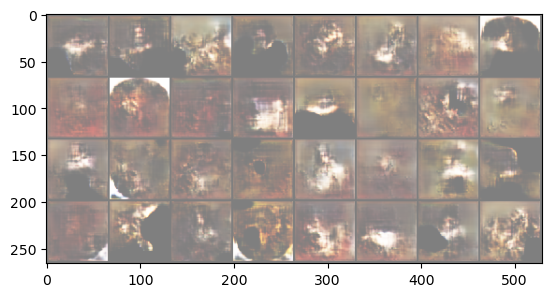

Epoch [221/400] Batch 0/5                   Loss D: 0.3608, loss G: 3.7376 
 Disc Real Prob 0.6967050433158875 Disc Fake Prob 0.5809985399246216
Epoch [222/400] Batch 0/5                   Loss D: 0.2896, loss G: 2.0471 
 Disc Real Prob 0.6645438075065613 Disc Fake Prob 0.5281360149383545
Epoch [223/400] Batch 0/5                   Loss D: 0.3019, loss G: 2.8338 
 Disc Real Prob 0.6746189594268799 Disc Fake Prob 0.5452162027359009
Epoch [224/400] Batch 0/5                   Loss D: 0.4171, loss G: 4.5788 
 Disc Real Prob 0.6969204545021057 Disc Fake Prob 0.5896725654602051
Epoch [225/400] Batch 0/5                   Loss D: 0.2982, loss G: 2.9349 
 Disc Real Prob 0.675734281539917 Disc Fake Prob 0.5352579355239868
Epoch [226/400] Batch 0/5                   Loss D: 0.2611, loss G: 4.4079 
 Disc Real Prob 0.7085199952125549 Disc Fake Prob 0.5630323886871338
Epoch [227/400] Batch 0/5                   Loss D: 0.4148, loss G: 4.2797 
 Disc Real Prob 0.6886690258979797 Disc Fake Prob 0.585

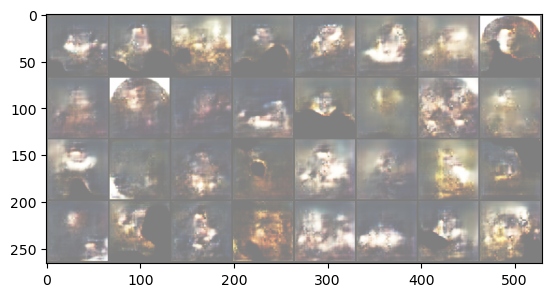

Epoch [231/400] Batch 0/5                   Loss D: 0.9269, loss G: 7.3057 
 Disc Real Prob 0.7137979865074158 Disc Fake Prob 0.6612622737884521
Epoch [232/400] Batch 0/5                   Loss D: 0.5018, loss G: 3.6464 
 Disc Real Prob 0.6542718410491943 Disc Fake Prob 0.555343508720398
Epoch [233/400] Batch 0/5                   Loss D: 0.3946, loss G: 3.4404 
 Disc Real Prob 0.6955481767654419 Disc Fake Prob 0.5848501920700073
Epoch [234/400] Batch 0/5                   Loss D: 0.3668, loss G: 4.4144 
 Disc Real Prob 0.6779413223266602 Disc Fake Prob 0.5632802248001099
Epoch [235/400] Batch 0/5                   Loss D: 0.6238, loss G: 4.0298 
 Disc Real Prob 0.7255090475082397 Disc Fake Prob 0.6415073871612549
Epoch [236/400] Batch 0/5                   Loss D: 0.3315, loss G: 3.0429 
 Disc Real Prob 0.6582896709442139 Disc Fake Prob 0.5269233584403992
Epoch [237/400] Batch 0/5                   Loss D: 0.2942, loss G: 2.9366 
 Disc Real Prob 0.6970936059951782 Disc Fake Prob 0.564

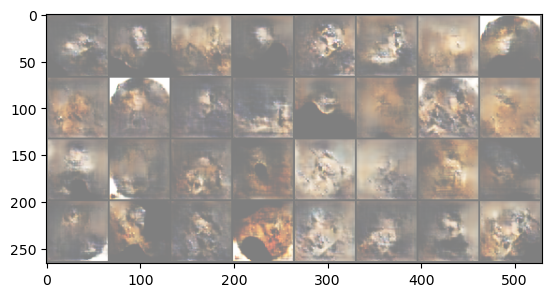

Epoch [241/400] Batch 0/5                   Loss D: 0.4171, loss G: 3.5709 
 Disc Real Prob 0.7048588991165161 Disc Fake Prob 0.5968849062919617
Epoch [242/400] Batch 0/5                   Loss D: 0.6001, loss G: 4.7130 
 Disc Real Prob 0.7196056842803955 Disc Fake Prob 0.6322207450866699
Epoch [243/400] Batch 0/5                   Loss D: 0.3016, loss G: 3.3623 
 Disc Real Prob 0.6837296485900879 Disc Fake Prob 0.5514019727706909
Epoch [244/400] Batch 0/5                   Loss D: 0.3680, loss G: 2.7577 
 Disc Real Prob 0.6810998916625977 Disc Fake Prob 0.5707032084465027
Epoch [245/400] Batch 0/5                   Loss D: 0.3558, loss G: 3.5305 
 Disc Real Prob 0.7125773429870605 Disc Fake Prob 0.5909653902053833
Epoch [246/400] Batch 0/5                   Loss D: 0.3842, loss G: 3.5370 
 Disc Real Prob 0.6810595989227295 Disc Fake Prob 0.5708800554275513
Epoch [247/400] Batch 0/5                   Loss D: 0.2140, loss G: 3.7049 
 Disc Real Prob 0.6898139715194702 Disc Fake Prob 0.53

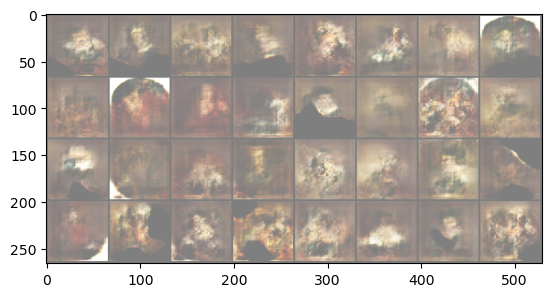

Epoch [251/400] Batch 0/5                   Loss D: 0.4387, loss G: 2.7546 
 Disc Real Prob 0.646309494972229 Disc Fake Prob 0.5359581708908081
Epoch [252/400] Batch 0/5                   Loss D: 0.3180, loss G: 3.8044 
 Disc Real Prob 0.6883955001831055 Disc Fake Prob 0.558834969997406
Epoch [253/400] Batch 0/5                   Loss D: 0.2754, loss G: 3.1734 
 Disc Real Prob 0.6813400983810425 Disc Fake Prob 0.5341662168502808
Epoch [254/400] Batch 0/5                   Loss D: 0.8312, loss G: 4.9872 
 Disc Real Prob 0.7238982915878296 Disc Fake Prob 0.6611825227737427
Epoch [255/400] Batch 0/5                   Loss D: 0.1874, loss G: 4.3169 
 Disc Real Prob 0.6986549496650696 Disc Fake Prob 0.5104460120201111
Epoch [256/400] Batch 0/5                   Loss D: 0.2589, loss G: 3.5065 
 Disc Real Prob 0.7032052874565125 Disc Fake Prob 0.5587415099143982
Epoch [257/400] Batch 0/5                   Loss D: 0.2342, loss G: 3.7921 
 Disc Real Prob 0.6964793801307678 Disc Fake Prob 0.5434

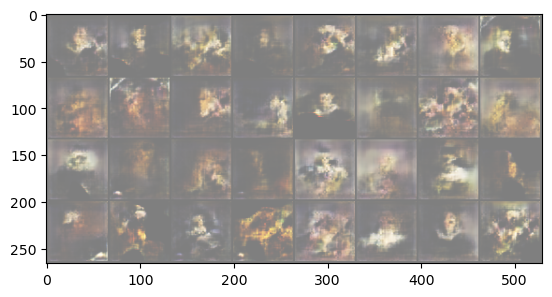

Epoch [261/400] Batch 0/5                   Loss D: 0.2881, loss G: 3.2090 
 Disc Real Prob 0.6876334547996521 Disc Fake Prob 0.5438013076782227
Epoch [262/400] Batch 0/5                   Loss D: 0.4543, loss G: 3.8174 
 Disc Real Prob 0.699953556060791 Disc Fake Prob 0.59316486120224
Epoch [263/400] Batch 0/5                   Loss D: 0.2750, loss G: 3.4828 
 Disc Real Prob 0.7016431093215942 Disc Fake Prob 0.5655524730682373
Epoch [264/400] Batch 0/5                   Loss D: 0.4935, loss G: 1.7398 
 Disc Real Prob 0.6223975419998169 Disc Fake Prob 0.5156794190406799
Epoch [265/400] Batch 0/5                   Loss D: 0.2727, loss G: 3.3112 
 Disc Real Prob 0.6691937446594238 Disc Fake Prob 0.5289732217788696
Epoch [266/400] Batch 0/5                   Loss D: 0.4283, loss G: 3.8115 
 Disc Real Prob 0.6841222047805786 Disc Fake Prob 0.5559819936752319
Epoch [267/400] Batch 0/5                   Loss D: 0.2486, loss G: 4.6211 
 Disc Real Prob 0.7084642052650452 Disc Fake Prob 0.56171

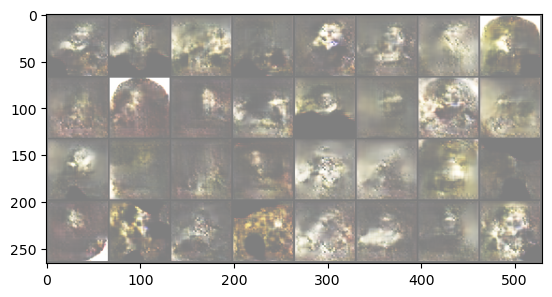

Epoch [271/400] Batch 0/5                   Loss D: 0.1772, loss G: 3.9645 
 Disc Real Prob 0.6935341954231262 Disc Fake Prob 0.523185133934021
Epoch [272/400] Batch 0/5                   Loss D: 0.2372, loss G: 3.2368 
 Disc Real Prob 0.697945237159729 Disc Fake Prob 0.5493748188018799
Epoch [273/400] Batch 0/5                   Loss D: 0.1819, loss G: 4.3124 
 Disc Real Prob 0.6923799514770508 Disc Fake Prob 0.5240579843521118
Epoch [274/400] Batch 0/5                   Loss D: 0.7976, loss G: 7.2962 
 Disc Real Prob 0.7213349342346191 Disc Fake Prob 0.6412931084632874
Epoch [275/400] Batch 0/5                   Loss D: 1.0620, loss G: 5.9013 
 Disc Real Prob 0.7159504890441895 Disc Fake Prob 0.6638036370277405
Epoch [276/400] Batch 0/5                   Loss D: 0.6688, loss G: 6.0400 
 Disc Real Prob 0.6894597411155701 Disc Fake Prob 0.5959967374801636
Epoch [277/400] Batch 0/5                   Loss D: 1.1474, loss G: 4.0604 
 Disc Real Prob 0.719246506690979 Disc Fake Prob 0.67019

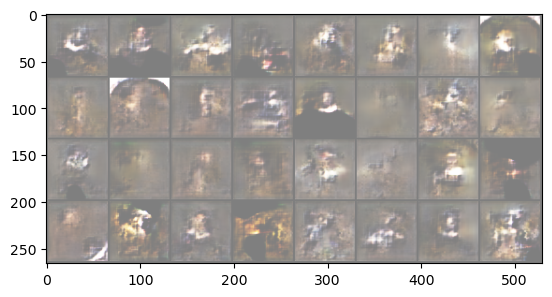

Epoch [281/400] Batch 0/5                   Loss D: 0.3546, loss G: 3.6704 
 Disc Real Prob 0.6853867173194885 Disc Fake Prob 0.5669952630996704
Epoch [282/400] Batch 0/5                   Loss D: 0.5651, loss G: 3.0896 
 Disc Real Prob 0.7247029542922974 Disc Fake Prob 0.6365776658058167
Epoch [283/400] Batch 0/5                   Loss D: 0.5122, loss G: 2.8479 
 Disc Real Prob 0.6327731609344482 Disc Fake Prob 0.5493032932281494
Epoch [284/400] Batch 0/5                   Loss D: 0.3513, loss G: 3.4736 
 Disc Real Prob 0.6907602548599243 Disc Fake Prob 0.5665000677108765
Epoch [285/400] Batch 0/5                   Loss D: 0.3641, loss G: 3.2478 
 Disc Real Prob 0.6866963505744934 Disc Fake Prob 0.5602404475212097
Epoch [286/400] Batch 0/5                   Loss D: 0.8802, loss G: 3.6879 
 Disc Real Prob 0.7256349921226501 Disc Fake Prob 0.6666533350944519
Epoch [287/400] Batch 0/5                   Loss D: 0.3974, loss G: 3.8248 
 Disc Real Prob 0.6508702635765076 Disc Fake Prob 0.52

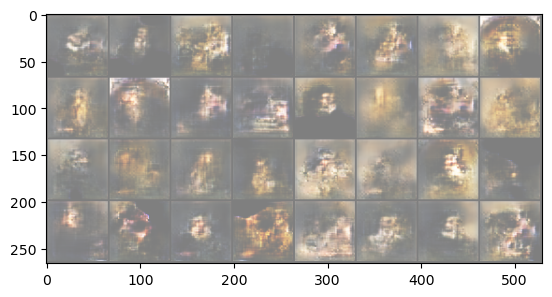

Epoch [291/400] Batch 0/5                   Loss D: 0.3753, loss G: 3.6578 
 Disc Real Prob 0.687768816947937 Disc Fake Prob 0.5683791637420654
Epoch [292/400] Batch 0/5                   Loss D: 0.2127, loss G: 3.2627 
 Disc Real Prob 0.6852136850357056 Disc Fake Prob 0.5298829078674316
Epoch [293/400] Batch 0/5                   Loss D: 0.6050, loss G: 4.7679 
 Disc Real Prob 0.7191474437713623 Disc Fake Prob 0.6308436989784241
Epoch [294/400] Batch 0/5                   Loss D: 0.2296, loss G: 4.0598 
 Disc Real Prob 0.6773445010185242 Disc Fake Prob 0.5178170204162598
Epoch [295/400] Batch 0/5                   Loss D: 0.2894, loss G: 3.4492 
 Disc Real Prob 0.7102386355400085 Disc Fake Prob 0.574630618095398
Epoch [296/400] Batch 0/5                   Loss D: 0.2035, loss G: 4.0079 
 Disc Real Prob 0.7138618230819702 Disc Fake Prob 0.5586742162704468
Epoch [297/400] Batch 0/5                   Loss D: 0.4653, loss G: 3.1656 
 Disc Real Prob 0.7164623737335205 Disc Fake Prob 0.6068

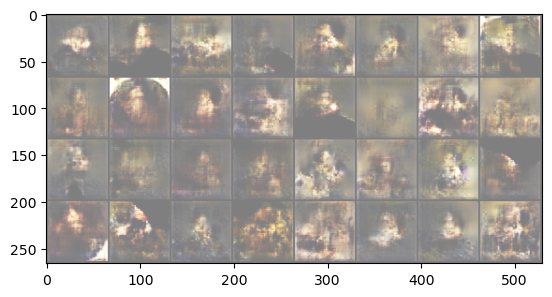

Epoch [301/400] Batch 0/5                   Loss D: 0.4661, loss G: 4.7608 
 Disc Real Prob 0.7160232067108154 Disc Fake Prob 0.6070379018783569
Epoch [302/400] Batch 0/5                   Loss D: 0.1923, loss G: 2.9825 
 Disc Real Prob 0.7104902267456055 Disc Fake Prob 0.5518950819969177
Epoch [303/400] Batch 0/5                   Loss D: 0.2435, loss G: 3.8543 
 Disc Real Prob 0.6976675391197205 Disc Fake Prob 0.5476897954940796
Epoch [304/400] Batch 0/5                   Loss D: 0.6545, loss G: 4.4905 
 Disc Real Prob 0.7252060174942017 Disc Fake Prob 0.6299770474433899
Epoch [305/400] Batch 0/5                   Loss D: 0.2552, loss G: 2.9762 
 Disc Real Prob 0.7004832625389099 Disc Fake Prob 0.5531307458877563
Epoch [306/400] Batch 0/5                   Loss D: 0.8629, loss G: 4.5441 
 Disc Real Prob 0.7136329412460327 Disc Fake Prob 0.6514726877212524
Epoch [307/400] Batch 0/5                   Loss D: 0.6083, loss G: 4.3167 
 Disc Real Prob 0.6721619963645935 Disc Fake Prob 0.58

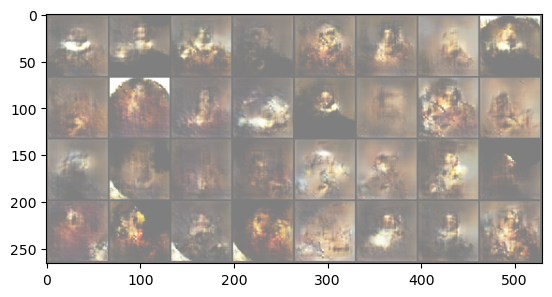

Epoch [311/400] Batch 0/5                   Loss D: 0.2683, loss G: 3.1307 
 Disc Real Prob 0.6904259324073792 Disc Fake Prob 0.5512725114822388
Epoch [312/400] Batch 0/5                   Loss D: 0.3652, loss G: 3.5437 
 Disc Real Prob 0.6830135583877563 Disc Fake Prob 0.5593246221542358
Epoch [313/400] Batch 0/5                   Loss D: 0.2187, loss G: 2.9507 
 Disc Real Prob 0.7037373781204224 Disc Fake Prob 0.5383056402206421
Epoch [314/400] Batch 0/5                   Loss D: 0.2084, loss G: 3.2226 
 Disc Real Prob 0.6991052031517029 Disc Fake Prob 0.5420316457748413
Epoch [315/400] Batch 0/5                   Loss D: 1.0829, loss G: 4.4871 
 Disc Real Prob 0.7284835577011108 Disc Fake Prob 0.678280234336853
Epoch [316/400] Batch 0/5                   Loss D: 0.2441, loss G: 3.2535 
 Disc Real Prob 0.6997863054275513 Disc Fake Prob 0.557858943939209
Epoch [317/400] Batch 0/5                   Loss D: 0.2520, loss G: 3.3989 
 Disc Real Prob 0.6999334096908569 Disc Fake Prob 0.5454

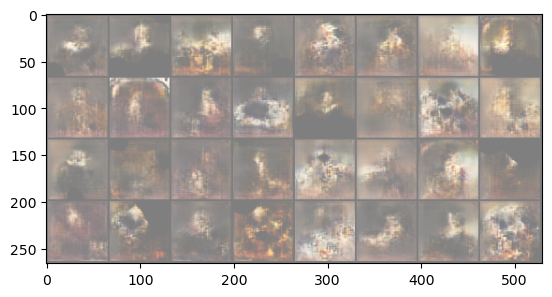

Epoch [321/400] Batch 0/5                   Loss D: 0.1990, loss G: 3.6703 
 Disc Real Prob 0.6946231722831726 Disc Fake Prob 0.5334206819534302
Epoch [322/400] Batch 0/5                   Loss D: 0.3022, loss G: 3.4715 
 Disc Real Prob 0.7116127014160156 Disc Fake Prob 0.5789873003959656
Epoch [323/400] Batch 0/5                   Loss D: 0.4200, loss G: 5.3820 
 Disc Real Prob 0.7132378816604614 Disc Fake Prob 0.5978912115097046
Epoch [324/400] Batch 0/5                   Loss D: 0.2649, loss G: 3.6000 
 Disc Real Prob 0.6898701190948486 Disc Fake Prob 0.5512701272964478
Epoch [325/400] Batch 0/5                   Loss D: 0.2678, loss G: 4.0074 
 Disc Real Prob 0.7096138000488281 Disc Fake Prob 0.5624523758888245
Epoch [326/400] Batch 0/5                   Loss D: 1.0538, loss G: 4.5266 
 Disc Real Prob 0.7286723852157593 Disc Fake Prob 0.6694269776344299
Epoch [327/400] Batch 0/5                   Loss D: 0.2558, loss G: 4.2698 
 Disc Real Prob 0.6856738924980164 Disc Fake Prob 0.53

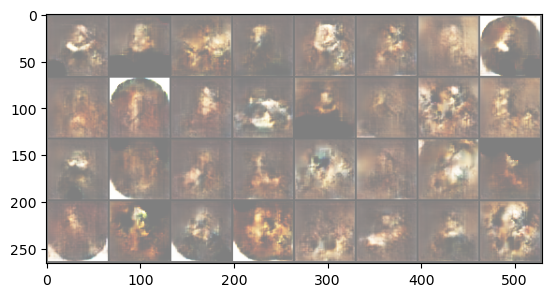

Epoch [331/400] Batch 0/5                   Loss D: 0.7671, loss G: 4.4424 
 Disc Real Prob 0.7162530422210693 Disc Fake Prob 0.6464204788208008
Epoch [332/400] Batch 0/5                   Loss D: 0.3085, loss G: 3.9583 
 Disc Real Prob 0.6676794290542603 Disc Fake Prob 0.5216057300567627
Epoch [333/400] Batch 0/5                   Loss D: 0.3286, loss G: 3.2790 
 Disc Real Prob 0.6783308386802673 Disc Fake Prob 0.5466424226760864
Epoch [334/400] Batch 0/5                   Loss D: 0.3537, loss G: 4.6286 
 Disc Real Prob 0.7073792815208435 Disc Fake Prob 0.5878881216049194
Epoch [335/400] Batch 0/5                   Loss D: 0.3937, loss G: 4.2038 
 Disc Real Prob 0.7210688591003418 Disc Fake Prob 0.5979747772216797
Epoch [336/400] Batch 0/5                   Loss D: 0.2469, loss G: 3.9490 
 Disc Real Prob 0.7095109224319458 Disc Fake Prob 0.5598946809768677
Epoch [337/400] Batch 0/5                   Loss D: 0.4597, loss G: 4.7279 
 Disc Real Prob 0.7091641426086426 Disc Fake Prob 0.59

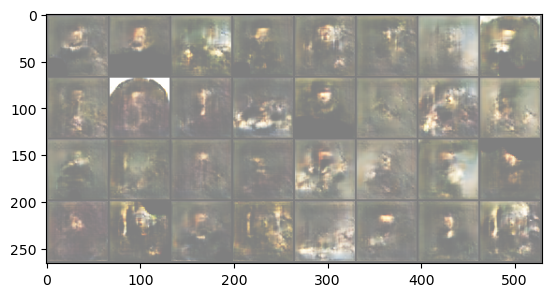

Epoch [341/400] Batch 0/5                   Loss D: 0.1814, loss G: 4.5899 
 Disc Real Prob 0.6906600594520569 Disc Fake Prob 0.5225479602813721
Epoch [342/400] Batch 0/5                   Loss D: 0.1693, loss G: 3.8949 
 Disc Real Prob 0.6925530433654785 Disc Fake Prob 0.5232973098754883
Epoch [343/400] Batch 0/5                   Loss D: 0.5500, loss G: 5.8022 
 Disc Real Prob 0.7249113917350769 Disc Fake Prob 0.6310771703720093
Epoch [344/400] Batch 0/5                   Loss D: 0.2306, loss G: 4.2213 
 Disc Real Prob 0.6891852021217346 Disc Fake Prob 0.5323441624641418
Epoch [345/400] Batch 0/5                   Loss D: 0.2272, loss G: 3.5760 
 Disc Real Prob 0.6854108572006226 Disc Fake Prob 0.52766352891922
Epoch [346/400] Batch 0/5                   Loss D: 0.2336, loss G: 5.0510 
 Disc Real Prob 0.7083184719085693 Disc Fake Prob 0.5542557239532471
Epoch [347/400] Batch 0/5                   Loss D: 0.2725, loss G: 4.1648 
 Disc Real Prob 0.7015140056610107 Disc Fake Prob 0.5540

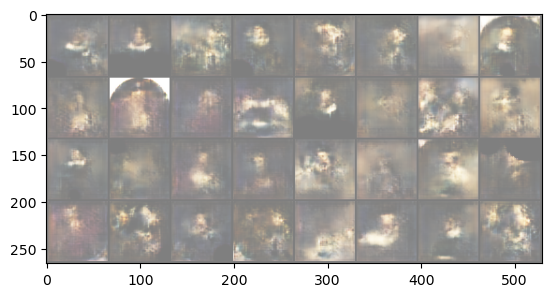

Epoch [351/400] Batch 0/5                   Loss D: 0.1593, loss G: 4.8714 
 Disc Real Prob 0.6958453059196472 Disc Fake Prob 0.5194244384765625
Epoch [352/400] Batch 0/5                   Loss D: 0.3245, loss G: 4.3027 
 Disc Real Prob 0.7203599214553833 Disc Fake Prob 0.5765900611877441
Epoch [353/400] Batch 0/5                   Loss D: 0.2640, loss G: 4.4554 
 Disc Real Prob 0.7110610008239746 Disc Fake Prob 0.5595329403877258
Epoch [354/400] Batch 0/5                   Loss D: 0.4118, loss G: 4.4605 
 Disc Real Prob 0.7204297780990601 Disc Fake Prob 0.5999792814254761
Epoch [355/400] Batch 0/5                   Loss D: 0.4160, loss G: 3.8163 
 Disc Real Prob 0.7027347087860107 Disc Fake Prob 0.5861673951148987
Epoch [356/400] Batch 0/5                   Loss D: 0.3164, loss G: 4.8228 
 Disc Real Prob 0.6696130633354187 Disc Fake Prob 0.5305043458938599
Epoch [357/400] Batch 0/5                   Loss D: 0.4987, loss G: 6.6406 
 Disc Real Prob 0.716049313545227 Disc Fake Prob 0.606

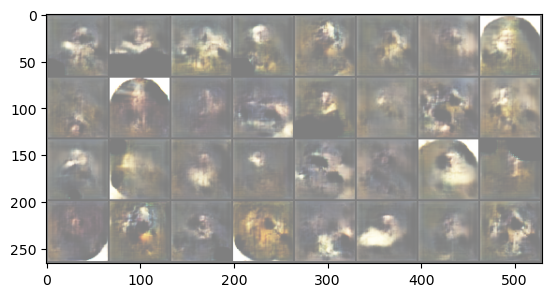

Epoch [361/400] Batch 0/5                   Loss D: 0.2968, loss G: 5.2771 
 Disc Real Prob 0.6944600343704224 Disc Fake Prob 0.5356923341751099
Epoch [362/400] Batch 0/5                   Loss D: 0.3110, loss G: 4.6630 
 Disc Real Prob 0.6988976001739502 Disc Fake Prob 0.5668158531188965
Epoch [363/400] Batch 0/5                   Loss D: 0.2675, loss G: 3.7047 
 Disc Real Prob 0.6633617877960205 Disc Fake Prob 0.5114675760269165
Epoch [364/400] Batch 0/5                   Loss D: 0.2847, loss G: 4.0229 
 Disc Real Prob 0.6908049583435059 Disc Fake Prob 0.5381731986999512
Epoch [365/400] Batch 0/5                   Loss D: 0.8578, loss G: 6.3692 
 Disc Real Prob 0.7279726266860962 Disc Fake Prob 0.6523873805999756
Epoch [366/400] Batch 0/5                   Loss D: 0.2481, loss G: 4.6936 
 Disc Real Prob 0.7187248468399048 Disc Fake Prob 0.5691840648651123
Epoch [367/400] Batch 0/5                   Loss D: 0.3655, loss G: 3.4413 
 Disc Real Prob 0.6571545004844666 Disc Fake Prob 0.53

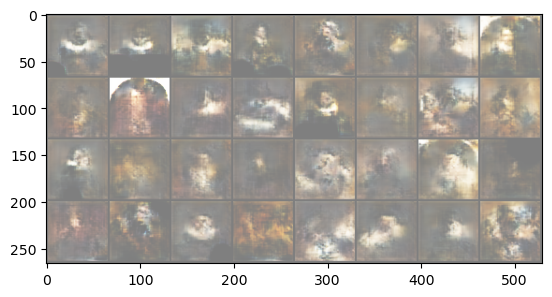

Epoch [371/400] Batch 0/5                   Loss D: 0.3042, loss G: 3.6563 
 Disc Real Prob 0.719947099685669 Disc Fake Prob 0.5832878351211548
Epoch [372/400] Batch 0/5                   Loss D: 0.2647, loss G: 4.1063 
 Disc Real Prob 0.6961528658866882 Disc Fake Prob 0.5522369742393494
Epoch [373/400] Batch 0/5                   Loss D: 0.3237, loss G: 4.9348 
 Disc Real Prob 0.7176730036735535 Disc Fake Prob 0.5834656357765198
Epoch [374/400] Batch 0/5                   Loss D: 0.5916, loss G: 5.3109 
 Disc Real Prob 0.7255828380584717 Disc Fake Prob 0.6316065788269043
Epoch [375/400] Batch 0/5                   Loss D: 0.2328, loss G: 4.9096 
 Disc Real Prob 0.7075769901275635 Disc Fake Prob 0.5561509132385254
Epoch [376/400] Batch 0/5                   Loss D: 0.2017, loss G: 3.6754 
 Disc Real Prob 0.7024536728858948 Disc Fake Prob 0.5404328107833862
Epoch [377/400] Batch 0/5                   Loss D: 0.5814, loss G: 6.1037 
 Disc Real Prob 0.7261949777603149 Disc Fake Prob 0.620

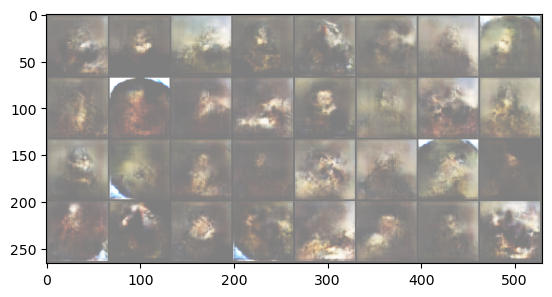

Epoch [381/400] Batch 0/5                   Loss D: 0.2313, loss G: 4.9321 
 Disc Real Prob 0.7190837860107422 Disc Fake Prob 0.5656751990318298
Epoch [382/400] Batch 0/5                   Loss D: 0.2314, loss G: 3.7205 
 Disc Real Prob 0.6788290143013 Disc Fake Prob 0.5162365436553955
Epoch [383/400] Batch 0/5                   Loss D: 0.1077, loss G: 4.8426 
 Disc Real Prob 0.7138007879257202 Disc Fake Prob 0.5239695310592651
Epoch [384/400] Batch 0/5                   Loss D: 0.2276, loss G: 4.2941 
 Disc Real Prob 0.707892119884491 Disc Fake Prob 0.551506757736206
Epoch [385/400] Batch 0/5                   Loss D: 0.2546, loss G: 4.5211 
 Disc Real Prob 0.7243895530700684 Disc Fake Prob 0.5732783079147339
Epoch [386/400] Batch 0/5                   Loss D: 0.2653, loss G: 4.2555 
 Disc Real Prob 0.6769505739212036 Disc Fake Prob 0.5287104845046997
Epoch [387/400] Batch 0/5                   Loss D: 0.2535, loss G: 3.6125 
 Disc Real Prob 0.6657105088233948 Disc Fake Prob 0.5135641

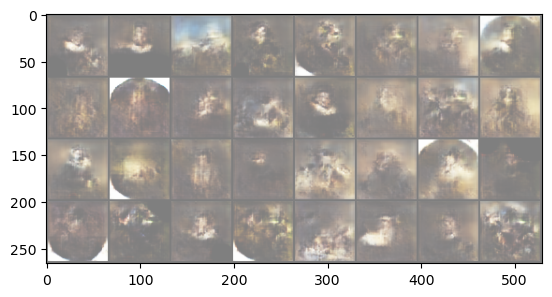

Epoch [391/400] Batch 0/5                   Loss D: 0.2551, loss G: 4.7637 
 Disc Real Prob 0.6630711555480957 Disc Fake Prob 0.5108280181884766
Epoch [392/400] Batch 0/5                   Loss D: 0.1744, loss G: 4.3034 
 Disc Real Prob 0.6977146863937378 Disc Fake Prob 0.5304582118988037
Epoch [393/400] Batch 0/5                   Loss D: 0.2006, loss G: 3.7064 
 Disc Real Prob 0.6858046054840088 Disc Fake Prob 0.5229188799858093
Epoch [394/400] Batch 0/5                   Loss D: 0.1818, loss G: 4.1530 
 Disc Real Prob 0.7162548899650574 Disc Fake Prob 0.5483071804046631
Epoch [395/400] Batch 0/5                   Loss D: 0.3095, loss G: 3.5012 
 Disc Real Prob 0.6673901677131653 Disc Fake Prob 0.5286262035369873
Epoch [396/400] Batch 0/5                   Loss D: 0.1609, loss G: 4.5204 
 Disc Real Prob 0.7180061340332031 Disc Fake Prob 0.5484972596168518
Epoch [397/400] Batch 0/5                   Loss D: 0.1524, loss G: 4.2772 
 Disc Real Prob 0.6940035820007324 Disc Fake Prob 0.51

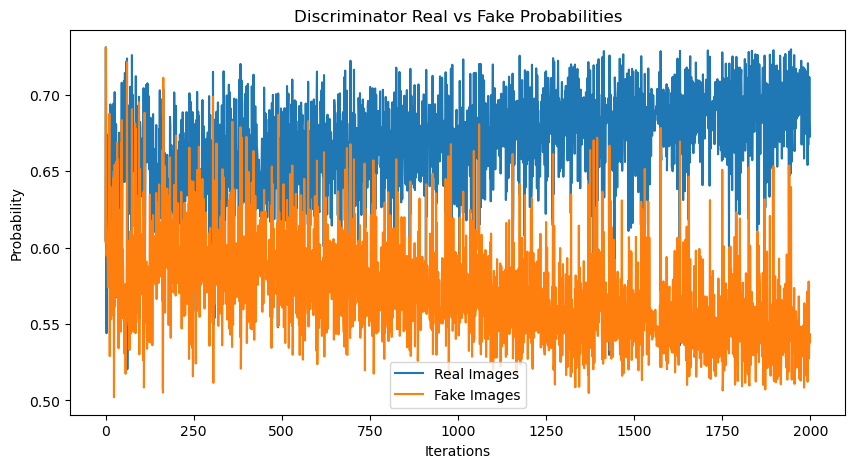

In [11]:
# Initialize lists to store discriminator probabilities for real and fake images
disc_real_probs = []
disc_fake_probs = []

# Training loop
gen.train()
disc.train()

for epoch in range(NUM_EPOCHS):
    for batch_idx, (real, _ ) in enumerate(dataloader):
        real = real.to(device)
        
        ### create noise tensor
        noise = torch.randn((BATCH_SIZE, Z_DIM, 1, 1)).to(device)
        fake = gen(noise)

        ### Train Discriminator: max log(D(x)) + log(1 - D(G(z)))
        disc_real = disc(real).reshape(-1)
        disc_fake = disc(fake.detach()).reshape(-1)
        
        #converted prob
        real_prob = torch.sigmoid(disc_real).mean().item()
        fake_prob = torch.sigmoid(disc_fake).mean().item()

        # Store the discriminator probabilities for real and fake images
        disc_real_probs.append(real_prob)
        disc_fake_probs.append(fake_prob)
        
        loss_disc_real = criterion(disc_real, torch.ones_like(disc_real))
        loss_disc_fake = criterion(disc_fake, torch.zeros_like(disc_fake))
        loss_disc = (loss_disc_real + loss_disc_fake) / 2
        disc.zero_grad()
        loss_disc.backward()
        opt_disc.step()

        ### Train Generator: min log(1 - D(G(z))) <-> max log(D(G(z))
        output = disc(fake).reshape(-1)
        loss_gen = criterion(output, torch.ones_like(output))
        gen.zero_grad()
        loss_gen.backward()
        opt_gen.step()

        ### Print losses occasionally and fake images occasionally
        if batch_idx % 50 == 0:
            print(
                f"Epoch [{epoch}/{NUM_EPOCHS}] Batch {batch_idx}/{len(dataloader)} \
                  Loss D: {loss_disc:.4f}, loss G: {loss_gen:.4f} \n Disc Real Prob {real_prob} Disc Fake Prob {fake_prob}"
            )
            if epoch % 10 == 0: 
                with torch.no_grad():
                    fake = gen(fixed_noise)
                    img_grid_real = torchvision.utils.make_grid(real[:32], normalize=True)
                    img_grid_fake = torchvision.utils.make_grid(fake[:32], normalize=True)
                    show_tensor_images(img_grid_fake)
            
        

# Plotting the probabilities
plt.figure(figsize=(10, 5))
plt.title("Discriminator Real vs Fake Probabilities")
plt.plot(disc_real_probs, label="Real Images")
plt.plot(disc_fake_probs, label="Fake Images")
plt.xlabel("Iterations")
plt.ylabel("Probability")
plt.legend()
plt.show()


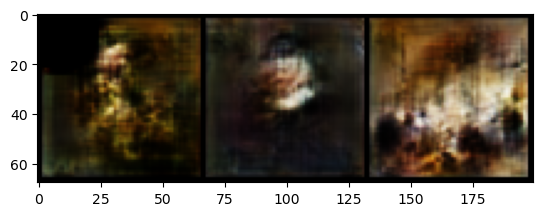

In [19]:
# Generate a single new image
z_dim = Z_DIM  # Ensure this matches the latent dimension you used during training
single_noise = torch.randn(3, z_dim, 1, 1).to(device)  # Batch size of 1 for a single image
with torch.no_grad():  # No need to compute gradients for generation
    generated_image = gen(single_noise).detach().cpu()  # Pass noise through generator

# Convert to a displayable format and show/save
show_tensor_images(generated_image, num_images=3)


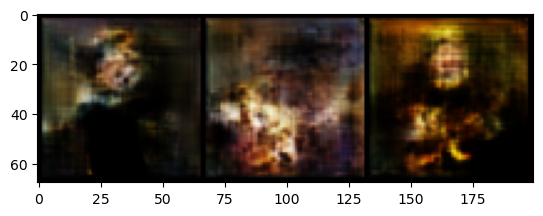

In [20]:
# Generate a single new image
z_dim = Z_DIM  # Ensure this matches the latent dimension you used during training
single_noise = torch.randn(3, z_dim, 1, 1).to(device)  # Batch size of 1 for a single image
with torch.no_grad():  # No need to compute gradients for generation
    generated_image = gen(single_noise).detach().cpu()  # Pass noise through generator

# Convert to a displayable format and show/save
show_tensor_images(generated_image, num_images=3)

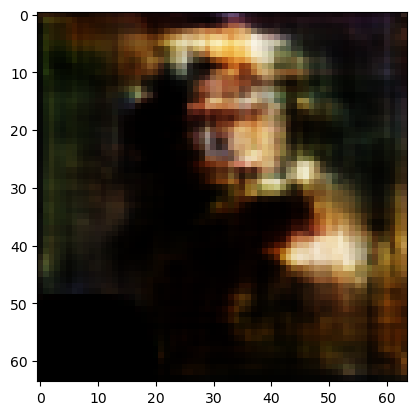

In [21]:
# Generate a single new image
z_dim = Z_DIM  # Ensure this matches the latent dimension you used during training
single_noise = torch.randn(1, z_dim, 1, 1).to(device)  # Batch size of 1 for a single image
with torch.no_grad():  # No need to compute gradients for generation
    generated_image = gen(single_noise).detach().cpu()  # Pass noise through generator

# Convert to a displayable format and show/save
show_tensor_images(generated_image, num_images=1)

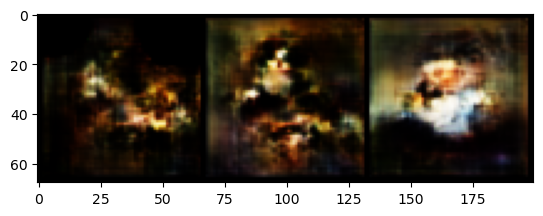

In [22]:
# Generate a single new image
z_dim = Z_DIM  # Ensure this matches the latent dimension you used during training
single_noise = torch.randn(3, z_dim, 1, 1).to(device)  # Batch size of 1 for a single image
with torch.no_grad():  # No need to compute gradients for generation
    generated_image = gen(single_noise).detach().cpu()  # Pass noise through generator

# Convert to a displayable format and show/save
show_tensor_images(generated_image, num_images=3)

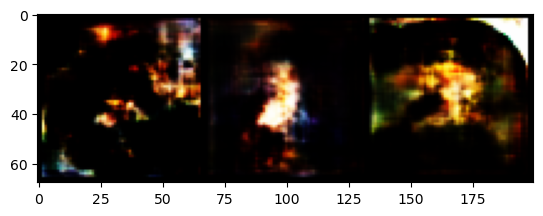

In [23]:
# Generate a single new image
z_dim = Z_DIM  # Ensure this matches the latent dimension you used during training
single_noise = torch.randn(3, z_dim, 1, 1).to(device)  # Batch size of 1 for a single image
with torch.no_grad():  # No need to compute gradients for generation
    generated_image = gen(single_noise).detach().cpu()  # Pass noise through generator

# Convert to a displayable format and show/save
show_tensor_images(generated_image, num_images=3)

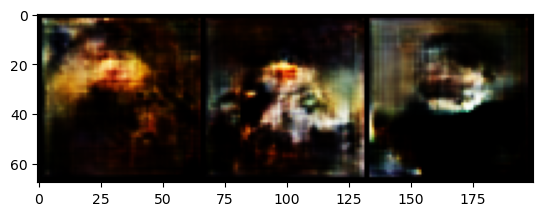

In [25]:
# Generate a single new image
z_dim = Z_DIM  # Ensure this matches the latent dimension you used during training
single_noise = torch.randn(3, z_dim, 1, 1).to(device)  # Batch size of 1 for a single image
with torch.no_grad():  # No need to compute gradients for generation
    generated_image = gen(single_noise).detach().cpu()  # Pass noise through generator

# Convert to a displayable format and show/save
show_tensor_images(generated_image, num_images=3)

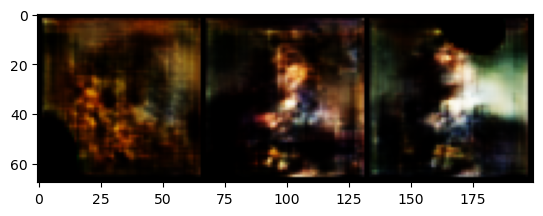

In [26]:
# Generate a single new image
z_dim = Z_DIM  # Ensure this matches the latent dimension you used during training
single_noise = torch.randn(3, z_dim, 1, 1).to(device)  # Batch size of 1 for a single image
with torch.no_grad():  # No need to compute gradients for generation
    generated_image = gen(single_noise).detach().cpu()  # Pass noise through generator

# Convert to a displayable format and show/save
show_tensor_images(generated_image, num_images=3)

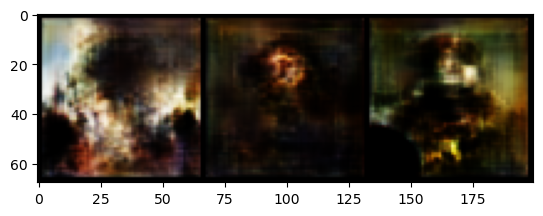

In [27]:
# Generate a single new image
z_dim = Z_DIM  # Ensure this matches the latent dimension you used during training
single_noise = torch.randn(3, z_dim, 1, 1).to(device)  # Batch size of 1 for a single image
with torch.no_grad():  # No need to compute gradients for generation
    generated_image = gen(single_noise).detach().cpu()  # Pass noise through generator

# Convert to a displayable format and show/save
show_tensor_images(generated_image, num_images=3)